In [3]:
import os
import pandas as pd
path = os.path.join( "..", "data", "processed", "accidents_clean.csv")
accidents_clean = pd.read_csv(path)



In [4]:
import folium
from folium.plugins import HeatMap
from folium.plugins import HeatMap

accidents_filtered = accidents_clean[
    accidents_clean['lat'].notna() &
    accidents_clean['long'].notna() &
    accidents_clean['grav'].notna()
]


heat_data = [
    [row['lat'], row['long']]
    for _, row in accidents_filtered.iterrows()
]

map_fr = folium.Map(location=[46.6, 2.2], zoom_start=6)
HeatMap(heat_data, radius=2, blur=3, min_opacity=0.4, max_zoom=14).add_to(map_fr)

map_fr


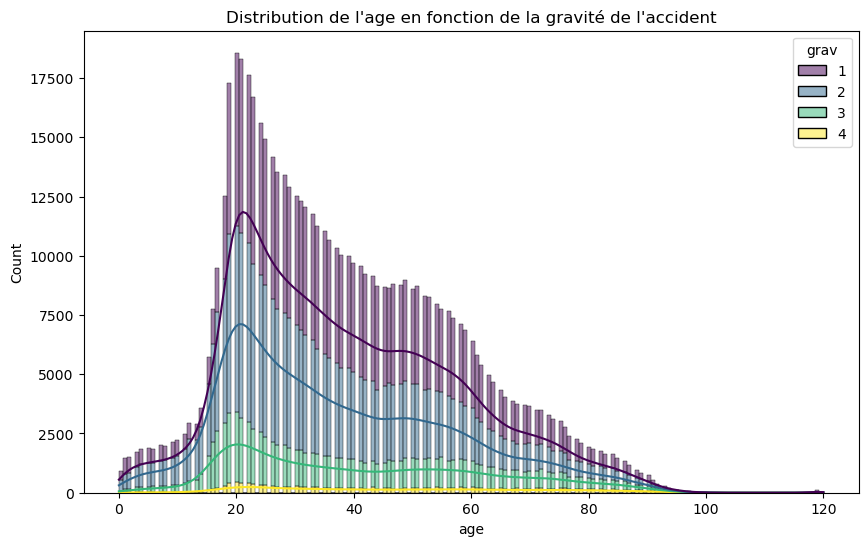

In [13]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.histplot(data=accidents_clean, x='age', hue='grav', kde=True, multiple='stack', palette='viridis')
plt.title(f"Distribution de l'age en fonction de la gravité de l'accident")
plt.savefig("../reports/figures/1.0-Seb-age_gravite.png")
plt.show()

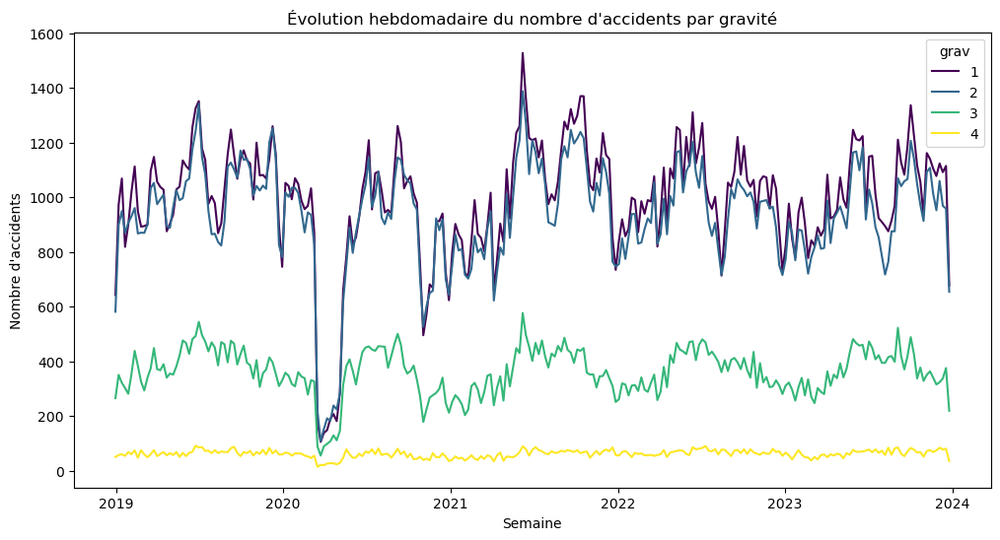

In [14]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

accidents_clean['date'] = pd.to_datetime(accidents_clean['date'])
accidents_clean['week'] = accidents_clean['date'].dt.to_period('W').dt.start_time
accidents_weekly = accidents_clean.groupby(['week', 'grav']).size().reset_index(name='counts')

plt.figure(figsize=(12, 6))
sns.lineplot(data=accidents_weekly, x='week', y='counts', hue='grav', errorbar=('ci', 95), palette='viridis')
plt.title("Évolution hebdomadaire du nombre d'accidents par gravité")
plt.xlabel("Semaine")
plt.ylabel("Nombre d'accidents")
plt.savefig("../reports/figures/1.0-Seb-time_gravite.png")

plt.show()

In [7]:
accidents_clean['date'] = pd.to_datetime(accidents_clean['date'])
accidents_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 614559 entries, 0 to 614558
Data columns (total 39 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   id_vehicule  614559 non-null  object        
 1   num_veh      614559 non-null  object        
 2   catv         614559 non-null  int64         
 3   obs          614559 non-null  int64         
 4   obsm         614559 non-null  int64         
 5   choc         614559 non-null  int64         
 6   manv         614559 non-null  int64         
 7   motor        614559 non-null  int64         
 8   place        614559 non-null  int64         
 9   catu         614559 non-null  int64         
 10  grav         614559 non-null  int64         
 11  sexe         614559 non-null  int64         
 12  trajet       614559 non-null  int64         
 13  secu1        614559 non-null  int64         
 14  jour         614559 non-null  int64         
 15  mois         614559 non-null  int6

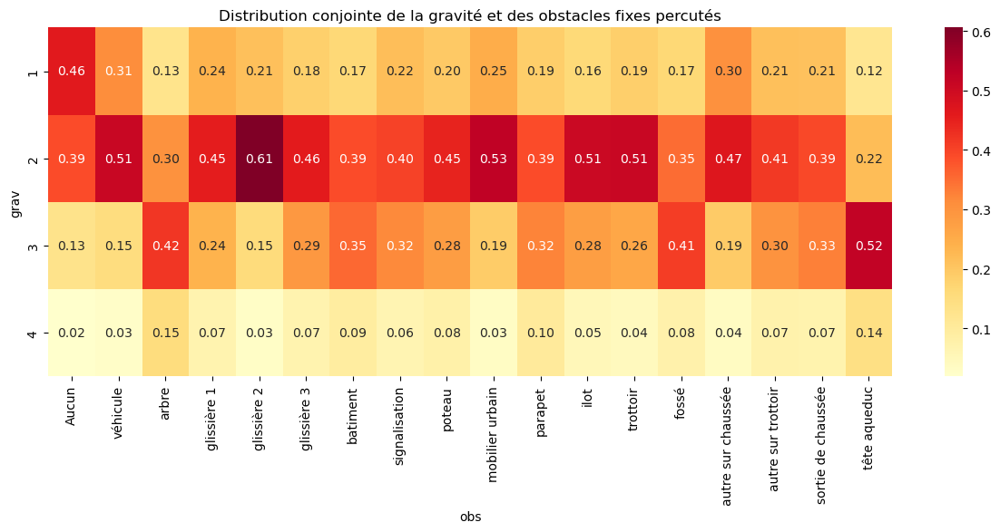

In [8]:



table = pd.crosstab(accidents_clean['grav'],accidents_clean['obs'], normalize='columns')
plt.figure(figsize=(15, 5))
sns.heatmap(table, annot=True, cmap='YlOrRd', fmt='.2f')
plt.title("Distribution conjointe de la gravité et des obstacles fixes percutés")
plt.xticks(ticks=[0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5, 7.5,8.5,9.5,10.5,11.5,12.5,13.5,14.5,15.5,16.5,17.5], 
           labels=['Aucun','véhicule','arbre','glissière 1', 'glissière 2', 'glissière 3','batiment',
                   'signalisation','poteau','mobilier urbain', 'parapet','ilot','trottoir','fossé',
                   'autre sur chaussée', 'autre sur trottoir','sortie de chaussée','tête aqueduc' ],
                   rotation =90)
plt.show()

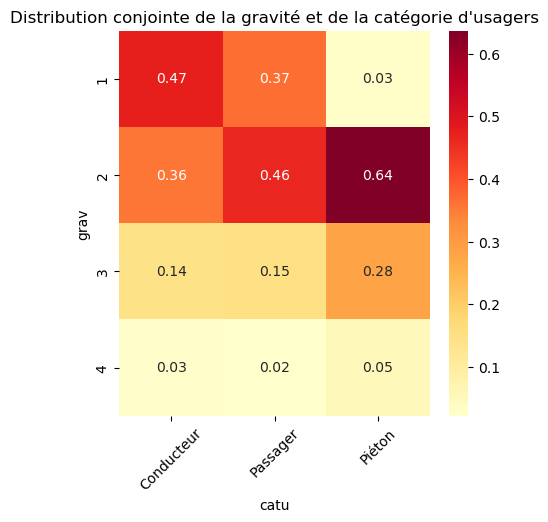

In [9]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


table = pd.crosstab(accidents_clean['grav'],accidents_clean['catu'], normalize='columns')
plt.figure(figsize=(5, 5))
sns.heatmap(table, annot=True, cmap='YlOrRd', fmt='.2f')
plt.title("Distribution conjointe de la gravité et de la catégorie d'usagers")
plt.xticks(ticks=[0.5, 1.5, 2.5], 
           labels=['Conducteur','Passager','Piéton'],
                   rotation =45)
plt.show()

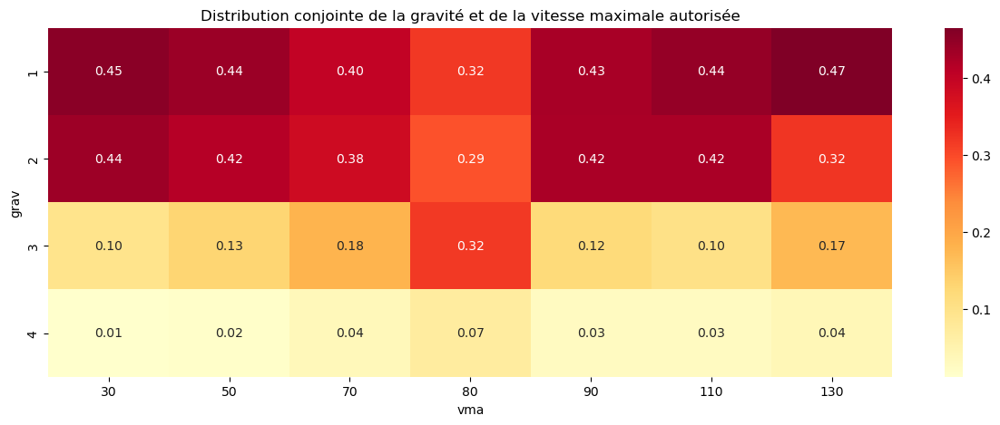

In [10]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

table = pd.crosstab(accidents_clean['grav'],accidents_clean['vma'], normalize='columns')
plt.figure(figsize=(15, 5))
sns.heatmap(table, annot=True, cmap='YlOrRd', fmt='.2f')
plt.title("Distribution conjointe de la gravité et de la vitesse maximale autorisée")

plt.show()

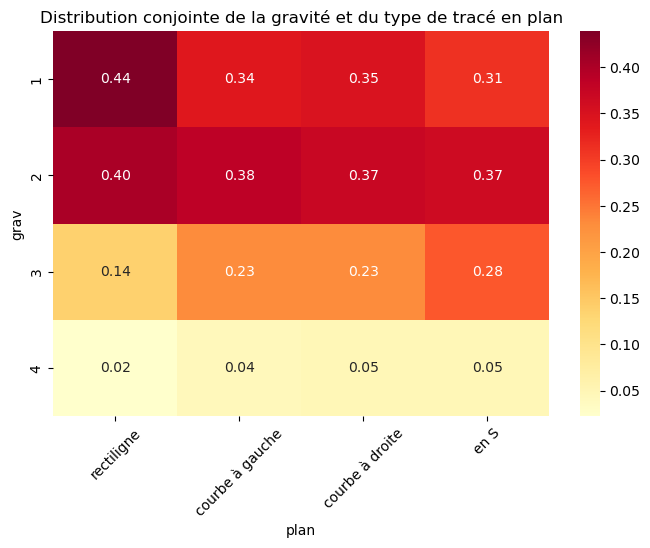

In [11]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

table = pd.crosstab(accidents_clean['grav'],accidents_clean['plan'], normalize='columns')
plt.figure(figsize=(8, 5))
sns.heatmap(table, annot=True, cmap='YlOrRd', fmt='.2f')
plt.title("Distribution conjointe de la gravité et du type de tracé en plan")
plt.xticks(ticks=[0.5, 1.5, 2.5, 3.5], 
           labels=['rectiligne','courbe à gauche','courbe à droite','en S'],
                   rotation =45)
plt.show()